# Capstone Project - The Battle of the Neighborhoods (week5)



## Table of contents

    •Introduction: Business Problem
    •Data
    •Methodology
    •Results and Discussion
    •Conclusion


## 1. INTRODUCTION 

Colorado is the largest state in central United States and is currently growing. For those who want to move to this state, I will try to compare the 2020 rents by county in order to give them the best information to prepare for the Colorado rent prices.

    •Which areas have the most favorable rent
    •Making the Colorado temperature map



### Before we start work on data, let's import all libraries.

In [1]:
!pip install geocoder
!pip install folium

from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
from geopy.distance import great_circle

#!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library
import os 
from folium import plugins
import pandas as pd
from folium.plugins import MarkerCluster

import pandas as pd
import numpy as np
import json # library to handle JSON files

import requests # library to handle requests
from requests import get

from bs4 import BeautifulSoup

import re

from time import sleep

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

import seaborn as sns

import json # library to handle JSON files
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# import k-means from clustering stage
from sklearn.cluster import KMeans

#!conda install -c conda-forge folium=0.5.0 --yes
!pip install folium --upgrade


print("All Required Libraries Imported!")



Requirement already up-to-date: folium in ./opt/anaconda3/lib/python3.8/site-packages (0.12.1)
All Required Libraries Imported!


## 2. DATA

The data on apartments: number of rooms, counties, and price is collected by scraping a website with data listings (rentdata.org/states/colorado/). Also we will use csv file taht we get to latitude and longitude data for counties.

We clean up the values and calculate average price by county. The data is pre-processed and we get our first data frame:


### Scrabing rentdata.org for apartmenst and county datas in Colorado

let's define functions which we use later in this project.

In [2]:
def scrap_by_year(year):
    pass

    ### GET THE TABLE WITH USE BEATIFULSOUP
    
    url= 'https://www.rentdata.org/states/colorado/' + str(year)
    html_data=requests.get(url).text
    soup = BeautifulSoup(html_data, "lxml")
    soup.findAll("table", attrs={"id": "state_table"})
    
    ### NOW WE NEED TO MAKE LOOP TO FIND LAST 4 YEARS DATA AND GET THE TABLE
    
    for table in soup.find_all('table', attrs={"id":"state_table"}):
        table_headers = table.findAll('th')
    counties = []
    for table in soup.find_all('table', attrs={"id":"state_table"}):
        table_body = table.findAll('tbody')
        for table_row in table_body:
            county_names = table_row.findAll('b')
            for cn in county_names:
                pass
                counties.append(cn.text)
    len(counties)
    list_master = []
    for table in soup.find_all('table', attrs={"id":"state_table"}):
        table_body = table.findAll('tbody')
        for table_body in table_body:
            pass
            for table_row in table_body.findAll('tr'):
                pass
                list_of_prices = table_row.findAll('span', attrs = { 'class':'money'})
                list_master.append([
                span.text.replace('$', '').replace(',','') for span in list(list_of_prices)
                ])    
    len(list_of_prices)            
    list_master
    new_list_master = []
    for (county, liste) in zip(counties, list_master):
        pass
        new_list = []
        new_list.append(liste)
        new_list_master.append(county)
        
    ### TIME TO MAKE DATAFRAME
    
    co_market_rent=pd.DataFrame(list_master)
    co_market_rent.columns = [ '0BR', '1BR', '2BR', '3BR', '4BR']
    co_market_rent.head()
    df_county=pd.DataFrame(new_list_master)
    df_county.columns =['County']
    df_county.head()
    co_market_rent['County']= df_county
    co_market_rent.head()
    print('There are {} counties in the dataset for year {}'. format(co_market_rent.shape[0], str(year)))
    co_market_rent.dtypes
    co_market_rent.describe()
    co_market=co_market_rent.groupby('County').sum()
    co_market
    
    ### FIND AVERAGE DATA FOR ALL COUNTIES
    
    cols=['0BR','1BR','2BR','3BR','4BR']
    co_market['Average'] = co_market[cols].astype(float).mean(axis=1)
    co_market.head()
    
    ### WE NEED TO READ OUR CSV FILES TO GET LAT. AND LONG. DATA
    
    loc = pd.read_csv('Colorado_County_Boundaries.csv')
    df_coordinates = loc.drop(columns={'OBJECTID', 'COUNTY', 'LABEL', 'CNTY_FIPS', 'NUM_FIPS', 'US_FIPS'})
    
    ### 
    
    col_coordinates=df_coordinates.rename(columns={'FULL':'CountyName', 'CENT_LAT': 'Latitude', 'CENT_LONG': 'Longitude'})
    col_rent=pd.merge(co_market, col_coordinates, how='left', left_on='County', right_on='CountyName')
    col_rent.head()
    col_rent_data=col_rent.set_index('CountyName')
    col_rent_data['Year'] = str(year)
    return col_rent_data

In [3]:
df_20 = scrap_by_year(2020)
df_19 = scrap_by_year(2019)
df_18 = scrap_by_year(2018)
df_17 = scrap_by_year(2017)

There are 64 counties in the dataset for year 2020
There are 64 counties in the dataset for year 2019
There are 64 counties in the dataset for year 2018
There are 64 counties in the dataset for year 2017


### Let's check our dataframes

In [4]:
df_20.head().reset_index('CountyName')

,CountyName,0BR,1BR,2BR,3BR,4BR,Average,Latitude,Longitude,Year
0,Adams County,1114,1260,1566,2163,2488,1718.2,39.873634,-104.337935,2020
1,Alamosa County,606,609,749,984,1162,822.0,37.572892,-105.788287,2020
2,Arapahoe County,1114,1260,1566,2163,2488,1718.2,39.649772,-104.339219,2020
3,Archuleta County,693,698,919,1171,1605,1017.2,37.193596,-107.048329,2020
4,Baca County,606,609,714,1030,1254,842.6,37.319183,-102.560469,2020


In [5]:
df_19.head().reset_index('CountyName')

,CountyName,0BR,1BR,2BR,3BR,4BR,Average,Latitude,Longitude,Year
0,Adams County,1029,1204,1508,2119,2461,1664.2,39.873634,-104.337935,2019
1,Alamosa County,662,666,791,1052,1212,876.6,37.572892,-105.788287,2019
2,Arapahoe County,1029,1204,1508,2119,2461,1664.2,39.649772,-104.339219,2019
3,Archuleta County,752,756,954,1251,1479,1038.4,37.193596,-107.048329,2019
4,Baca County,596,604,700,1012,1230,828.4,37.319183,-102.560469,2019


In [6]:
df_18.head()

,0BR,1BR,2BR,3BR,4BR,Average,Latitude,Longitude,Year
CountyName,,,,,,,,,
Adams County,938,1127,1418,2031,2351,1573.0,39.873634,-104.337935,2018
Alamosa County,620,623,756,1061,1159,843.8,37.572892,-105.788287,2018
Arapahoe County,938,1127,1418,2031,2351,1573.0,39.649772,-104.339219,2018
Archuleta County,704,708,913,1242,1416,996.6,37.193596,-107.048329,2018
Baca County,590,607,697,1014,1228,827.2,37.319183,-102.560469,2018


### Now we will append all our dataframes by county

In [7]:
df_all=df_20.append(df_19).append(df_18).append(df_17).sort_values('CountyName').reset_index()
df_all.head(20)

,CountyName,0BR,1BR,2BR,3BR,4BR,Average,Latitude,Longitude,Year
0,Adams County,1114,1260,1566,2163,2488,1718.2,39.873634,-104.337935,2020
1,Adams County,938,1127,1418,2031,2351,1573.0,39.873634,-104.337935,2018
2,Adams County,1029,1204,1508,2119,2461,1664.2,39.873634,-104.337935,2019
3,Adams County,844,1031,1305,1896,2196,1454.4,39.873634,-104.337935,2017
4,Alamosa County,662,666,791,1052,1212,876.6,37.572892,-105.788287,2019
5,Alamosa County,568,572,715,1041,1096,798.4,37.572892,-105.788287,2017
6,Alamosa County,606,609,749,984,1162,822.0,37.572892,-105.788287,2020
7,Alamosa County,620,623,756,1061,1159,843.8,37.572892,-105.788287,2018
8,Arapahoe County,844,1031,1305,1896,2196,1454.4,39.649772,-104.339219,2017
9,Arapahoe County,1029,1204,1508,2119,2461,1664.2,39.649772,-104.339219,2019


## 3. VISUALIZE DATA

### We can visaulize the average rent price for all of counties in Colorado by year.

-	We will use the ‘plt’ function to visualize the change of average prices by year.

<AxesSubplot:title={'center':'AVERAGE PRICE CHANGE OVER YEAR'}, xlabel='Year', ylabel='Average'>

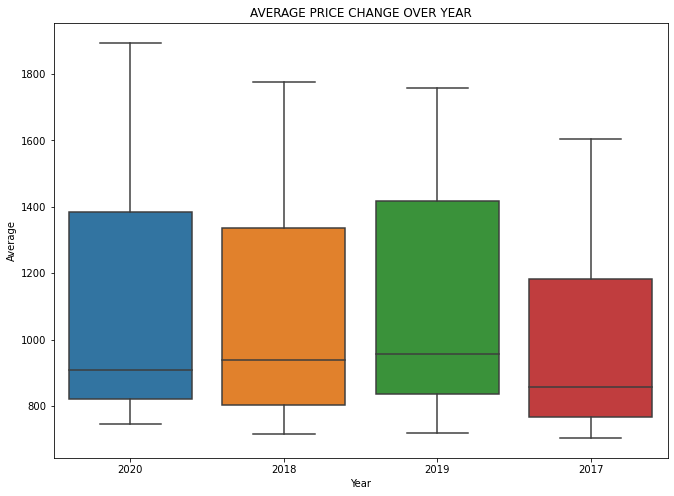

In [8]:
plt.figure(figsize=(11,8))
plt.title('AVERAGE PRICE CHANGE OVER YEAR')
sns.boxplot(x='Year', y='Average', data=df_all.reset_index())

## Let's also check the differences of the average price by county


<AxesSubplot:title={'center':'AVERAGE PRICE CHANGE BY COUNTIES'}, xlabel='CountyName', ylabel='Average'>

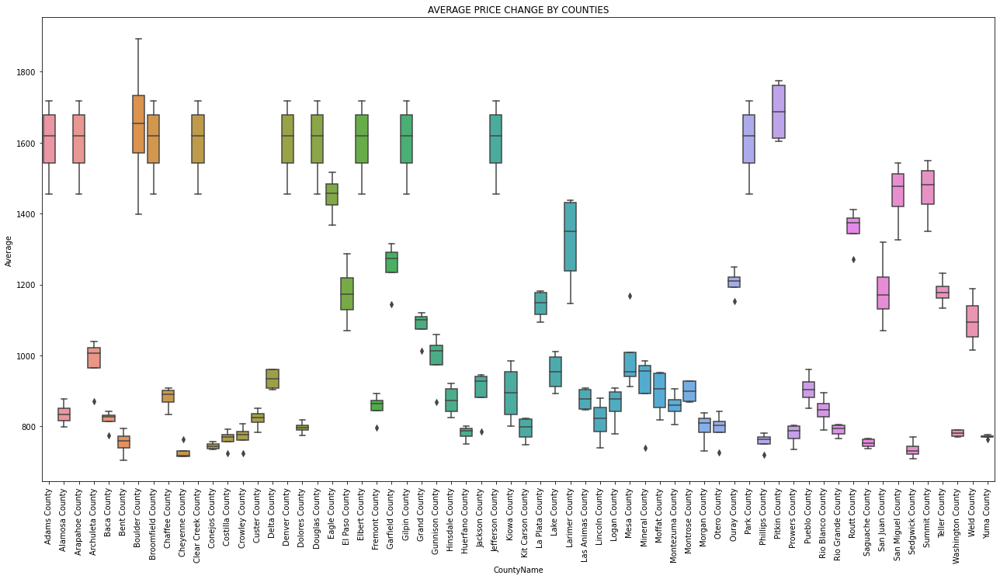

In [9]:
plt.figure(figsize=(22,11))
plt.xticks(rotation=90)
plt.title('AVERAGE PRICE CHANGE BY COUNTIES')
sns.boxplot(x='CountyName', y='Average', data=df_all.reset_index())

Comparing different years rent prices use with "groupby" function

In [10]:
group_data=df_all.groupby(['CountyName', 'Year'])
group_data.first()


0BR   1BR   2BR   3BR   4BR  Average   Latitude  \
CountyName     Year                                                     
Adams County   2017   844  1031  1305  1896  2196   1454.4  39.873634   
               2018   938  1127  1418  2031  2351   1573.0  39.873634   
               2019  1029  1204  1508  2119  2461   1664.2  39.873634   
               2020  1114  1260  1566  2163  2488   1718.2  39.873634   
Alamosa County 2017   568   572   715  1041  1096    798.4  37.572892   
...                   ...   ...   ...   ...   ...      ...        ...   
Weld County    2020   709   845  1046  1509  1833   1188.4  40.554840   
Yuma County    2017   509   512   681   991  1120    762.6  40.002899   
               2018   521   524   697  1014  1123    775.8  40.002899   
               2019   529   532   704  1017  1074    771.2  40.002899   
               2020   539   542   714  1021  1046    772.4  40.002899   

                      Longitude  
CountyName     Year              
Adams County   2017 -104.337935  
               2018 -104.337935  
               2019 -104.337935  
               2020 -104.337935  
Alamosa County 2017 -105.788287  
...                         ...  
Weld County    2020 -104.392525  
Yuma County    2017 -102.424226  
               2018 -102.424226  
               2019 -102.424226  
               2020 -102.424226  

[256 rows x 8 columns]

### Checking 3 Bedroom apt. & All type of apt. average market prices for year 2020

We will use df_20_col csv dataset for visualize data and we need set_index as CountyName. 

Three Bedroom apartments are most common apartment rented by a nuclear family. So, we will use 3BR apartments and the average price data of 0BR, 1BR, 2BR, 3BR, and 4BR apartments to get a general idea of Colorado rent marketing.

In [11]:
df_20_col=pd.read_csv('colorado rent data 2020.csv').set_index('CountyName')

Now time to show on the bar plot average rent prices for all type of apartments and also 3 Bedroom apt. rent prices.

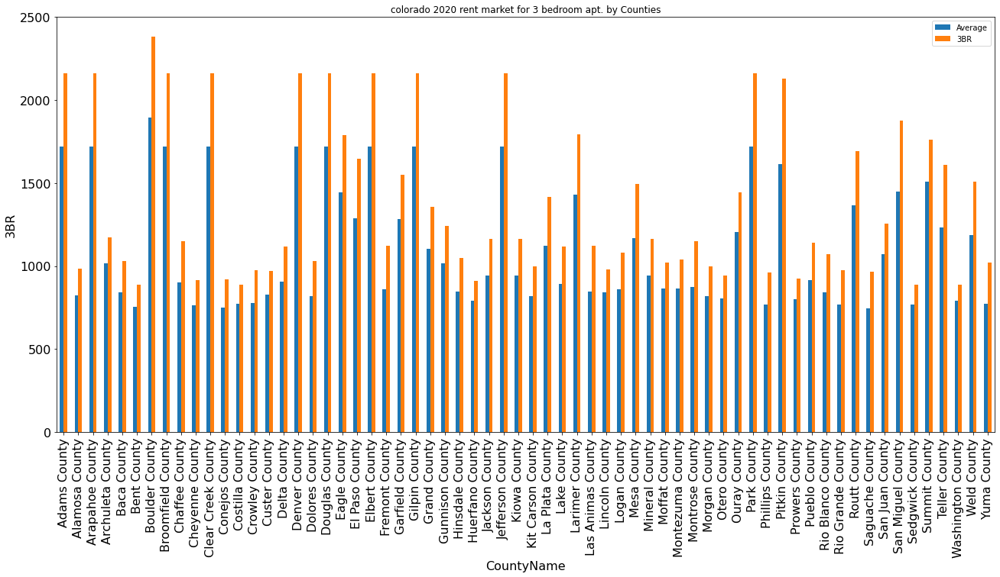

In [12]:

ax = df_20_col[['Average','3BR']].plot(kind='bar', title ="colorado 2020 rent market for 3 bedroom apt. by Counties", figsize=(22, 10), legend=True, fontsize=16)
ax.set_xlabel("CountyName", fontsize=16)
ax.set_ylabel("3BR", fontsize=16)
plt.show()

### Visualize the 3 Bedroom & average apartment prices per county on a choropleth map.
#### Extract only the Coloroda counties from the JSON file and edit the keys to match our data


In [13]:
df_20.to_csv('colorado rent data 2020.csv', index=True)
df_20_col=pd.read_csv('colorado rent data 2020.csv')

In [14]:
df_20_col.head()

,CountyName,0BR,1BR,2BR,3BR,4BR,Average,Latitude,Longitude,Year
0,Adams County,1114,1260,1566,2163,2488,1718.2,39.873634,-104.337935,2020
1,Alamosa County,606,609,749,984,1162,822.0,37.572892,-105.788287,2020
2,Arapahoe County,1114,1260,1566,2163,2488,1718.2,39.649772,-104.339219,2020
3,Archuleta County,693,698,919,1171,1605,1017.2,37.193596,-107.048329,2020
4,Baca County,606,609,714,1030,1254,842.6,37.319183,-102.560469,2020


In [15]:
df_20_col.to_dict()

{'CountyName': {0: 'Adams County',
  1: 'Alamosa County',
  2: 'Arapahoe County',
  3: 'Archuleta County',
  4: 'Baca County',
  5: 'Bent County',
  6: 'Boulder County',
  7: 'Broomfield County',
  8: 'Chaffee County',
  9: 'Cheyenne County',
  10: 'Clear Creek County',
  11: 'Conejos County',
  12: 'Costilla County',
  13: 'Crowley County',
  14: 'Custer County',
  15: 'Delta County',
  16: 'Denver County',
  17: 'Dolores County',
  18: 'Douglas County',
  19: 'Eagle County',
  20: 'El Paso County',
  21: 'Elbert County',
  22: 'Fremont County',
  23: 'Garfield County',
  24: 'Gilpin County',
  25: 'Grand County',
  26: 'Gunnison County',
  27: 'Hinsdale County',
  28: 'Huerfano County',
  29: 'Jackson County',
  30: 'Jefferson County',
  31: 'Kiowa County',
  32: 'Kit Carson County',
  33: 'La Plata County',
  34: 'Lake County',
  35: 'Larimer County',
  36: 'Las Animas County',
  37: 'Lincoln County',
  38: 'Logan County',
  39: 'Mesa County',
  40: 'Mineral County',
  41: 'Moffat C

In [16]:
with open('66c2642209684b90af84afcc559a5a02_5.geojson') as json_data:
    location_data=json.load(json_data)

### Time to make our map

-	We used Json data to collect Colorado County Boundaries from data-cd
-	phe.opendata.arcgis.com and used it with our data frame to make our map. 
-	We will add popup markers in the map to show Average price, 3BR and County Name when you click on each county.



In [17]:
gdf = df_20_col
col_map = folium.Map(location=[38.8501, -105.7821], zoom_start=7)
# m.save('osm.html')
col_map.choropleth(
    geo_data=location_data,
    data=gdf,
    columns=['CountyName', '3BR'],
    key_on='feature.properties.FULL',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Colorado 2020 Rent Market for 3 BedRoom apt. and Average Rent',
)
dict_thr ={}
dict_avg ={}
for county, three, avg in zip(gdf['CountyName'], gdf['3BR'], gdf['Average']):
    pass
    dict_thr[county] = three
    dict_avg[county] = avg
# dict_avg
# dict_thr
for json in location_data['features']:
    pass
    json['properties']['3BR'] = dict_thr[json['properties']['FULL']]
    json['properties']['Average'] = dict_avg[json['properties']['FULL']]
geo_json = folium.GeoJson(location_data, popup=folium.GeoJsonPopup(fields=["COUNTY", '3BR', 'Average']))
geo_json.add_to(col_map)


col_map


/Users/salihayhan/opt/anaconda3/lib/python3.8/site-packages/folium/folium.py:409: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  warnings.warn(


## 5.Discussion & Conclusion


As we see on the map, the most expensive region of Colorado is the capital city of Denver and the surrounding counties. During this project we applied different data science methods in order to answer our main question of which county in Colorado has the most expensive rent. We used Web Scrubbing methods to analyze the Colorado market rent data by year and we added this data on the volume map. We built a Colorado Choropleth map.


Salih S Ayhan